In [65]:
import pandas as pd
import numpy as np
import json
import folium
import urllib.request 
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon
import requests
from pandas.io.json import json_normalize
import sklearn.linear_model as skl_lm
import matplotlib.pyplot as plt
import statistics as st
from scipy.stats import pearsonr
import statsmodels.api as sm 
from sklearn.model_selection import KFold


## Get Data

#### Data From my Github repository

In [3]:
with urllib.request.urlopen("https://raw.githubusercontent.com/loouisbrandon/NY_Foursquare-/main/Neighborhood%20Tabulation%20Areas%20(NTA).geojson") as url:
    nbhd_boundaries = json.loads(url.read().decode())
    

with urllib.request.urlopen("https://raw.githubusercontent.com/loouisbrandon/NY_Foursquare-/main/After-School%20Programs.geojson") as url:
    after_school_programs = json.loads(url.read().decode())


with urllib.request.urlopen("https://raw.githubusercontent.com/loouisbrandon/NY_Foursquare-/main/Police%20Precincts.geojson") as url:
    precinct_boundaries = json.loads(url.read().decode())

quality_schools = pd.read_csv("https://raw.githubusercontent.com/loouisbrandon/NY_Foursquare-/main/Quality_Review_School_List.csv")


## Crime Data scraped from NYC Data repository

In [11]:
precinct_data = precinct_boundaries['features']

precinctNames = []

for i in precinct_data:
    name = i['properties']['precinct']
    precinctNames.append(name)

precName = []
y = str(0)

for i in range(len(precinctNames)):
    x = int(precinctNames[i])
    if x < 10:
        z = y+y+str(x)
    elif 10 <= x < 100:
        z = y + str(x)
    else:
        z = str(x)
        
    precName.append(z)

url_set = []
data_set_names = []

lead = 'https://www1.nyc.gov/assets/nypd/downloads/excel/crime_statistics/cs-en-us-'
tail = 'pct.xlsx'

for i in range(len(precName)):
    data_url = lead + precName[i] + tail
    prec_dataset_name = precName[i]
    url_set.append(data_url)
    data_set_names.append(prec_dataset_name)

crime_data = []

for i in range(len(data_set_names)):
    url = url_set[i]
    df = pd.read_excel(url)
    crime_data.append(df)

#### The goal of this project is to find the neighborhoods with the lowest crime, best schools and most amount of after school activities. We will be assuming the user of this code would be interested in moving to NYC with School-children, looking for a variety of school choices in a safe neighborhood.

## Lets get the coordinate shapes of the NTA neighborhoods into a dictionary

In [12]:
nbhd_coord_data = nbhd_boundaries['features']

coords = []
nbhdNames = []

for i in nbhd_coord_data:
    coord_shape = i['geometry']['coordinates']
    name = i['properties']['ntaname']
    coords.append(coord_shape)
    nbhdNames.append(name)

NTA_dict = dict(zip(nbhdNames, coords))

## Also let's get the centroids of Each Neighborhood 

In [13]:
centroids = []

for j in range(len(coords)):
    a = pd.DataFrame(coords[j][0][0], columns = ['Lat','Long'])
    lons_lats_vect = np.column_stack((a['Long'], a['Lat']))
    polygon = Polygon(lons_lats_vect)
    centroids.append([polygon.centroid.x,polygon.centroid.y])
    
nbhdCentroids_dict = dict(zip(nbhdNames, centroids))
nbhdCentroids = pd.DataFrame(centroids, columns = ['Latitude', 'Longitude'])
nbhdCentroids['Neighborhoods'] = nbhdNames

## And the coordinate shapes of the Precints into a dictionary

In [14]:
prec_coord_data = precinct_boundaries['features']

PrecCoords = []
PrecNames = []

for i in prec_coord_data:
    coord_shape = i['geometry']['coordinates']
    name = i['properties']['precinct']
    PrecCoords.append(coord_shape)
    PrecNames.append(name)
    
Prec_dict = dict(zip(PrecNames, PrecCoords))

## Now a quick visualization of the Police Precints over NYC and then the Neighborhoods

In [15]:
#Police Precints

map_newyork = folium.Map(location=[40.7128, -74.0060], zoom_start=10)

folium.Choropleth(geo_data = precinct_boundaries, 
                  fill_opacity = .25, 
                  line_opacity = .5,
                  fill_color='YlGn',
                  line_color = 'red').add_to(map_newyork)
map_newyork

In [16]:
#Neighborhood Boundaries

map_newyork = folium.Map(location=[40.7128, -74.0060], zoom_start=10)

folium.Choropleth(geo_data = nbhd_boundaries,
                  fill_opacity = .45, 
                  line_opacity = .5,
                  fill_color = '#FFA500',
                  line_color = 'blue').add_to(map_newyork)

map_newyork

## So let's make a DataFrame for precint and total crimes 

In [17]:
total_crime = []

for i in range(len(crime_data)):
    df = crime_data[i]
    tot_crime = df.iloc[19,9]
    total_crime.append(tot_crime)
    
crimes_dict = dict(zip(data_set_names,total_crime))
crimes_df = pd.DataFrame(precinctNames, columns = ['Precincts'] )
crimes_df['Total Crimes'] = total_crime 

crimes_df.to_json('crimeagg.json')
crimes_df = crimes_df.reset_index()
#crimes_df.columns = ['Precincts', 'Total Crimes']
crimes_df.drop(columns = ['index'], inplace = True)

## And find the 10 precints with lowest crime (total crime reported)

In [18]:
Low_crimes = crimes_df.sort_values(by = 'Total Crimes')
Low10_crime = crimes_df.sort_values(by = 'Total Crimes').head(10)

In [19]:
Low10_crime.to_json('crimeagg.json')
Low10_crime = Low10_crime.reset_index()
#crimes_df.columns = ['Precincts', 'Total Crimes']
Low10_crime.drop(columns = ['index'], inplace = True)

map_newyork = folium.Map(location=[40.7128, -74.0060], zoom_start=10)

map_newyork.choropleth(geo_data = precinct_boundaries,
                  data_out = 'crimeagg.json',
                  data = Low10_crime,
                  columns = ['Precincts', 'Total Crimes'],
                  key_on = 'feature.properties.precinct',
                  fill_opacity = 0.7, 
                  line_opacity = 0.8,
                  fill_color = 'YlOrRd')

map_newyork

/home/brandonlouis/.local/lib/python3.10/site-packages/folium/folium.py:409: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


In [20]:
Low10_crime

,Precincts,Total Crimes
0,22,7
1,123,81
2,100,88
3,76,95
4,26,144
5,69,148
6,68,174
7,88,174
8,122,187
9,112,188


## Now let's find the neighborhods with most afterschool activities 

In [21]:
program_data = after_school_programs['features']

columnNames = ['Borough','Site Name','Latitude','Longitude']

programs = pd.DataFrame(columns=columnNames)

for data in program_data:
    borough = neighborhood_name = data['properties']['site_borou']  
    site_name = data['properties']['site_name']
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    programs = programs.append({'Borough': borough,
                                'Site Name': site_name,
                                'Latitude': neighborhood_lat,
                                'Longitude': neighborhood_lon}, ignore_index=True)

nbhd = []
Loc_Name = []
afterSchoolLocLat = []
afterSchoolLocLong = []

for j in range(len(coords)):
    a = pd.DataFrame(coords[j][0][0], columns = ['Lat','Long'])
    lons_lats_vect = np.column_stack((a['Long'], a['Lat']))
    polygon = Polygon(lons_lats_vect)

    for i in range(len(programs)):
        program_lat = programs.iloc[i,2]
        program_long = programs.iloc[i,3]
        point = Point(program_lat, program_long)
        if polygon.contains(point) == True:
            nbhd.append(list(NTA_dict.keys())[j])
            Loc_Name.append(programs.iloc[i,1])
            afterSchoolLocLat.append(programs.iloc[i,2])
            afterSchoolLocLong.append(programs.iloc[i,3])

#Make Neighborhood DataFrame with locations/Neighborhood names of aftershool activities
afterSchool_Nbhds = pd.DataFrame(Loc_Name, columns = ['Location Name'])
afterSchool_Nbhds['Neighborhood'] = nbhd
afterSchool_Nbhds['Latitude'] = afterSchoolLocLat
afterSchool_Nbhds['Longitude'] = afterSchoolLocLong

#Make Neighborhood DataFrame with counts of afterschool activities
x = pd.DataFrame(nbhd, columns = ['Neighborhood'])
a = x['Neighborhood'].value_counts()
b = pd.DataFrame(a).reset_index()
b.columns = ['Neighborhood','Count of After School Activities']

/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed 

/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed 

/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed 

/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed 

/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed 

/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed 

/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed 

/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed 

/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed 

/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed 

/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed 

/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed 

/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed 

/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed 

/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed 

/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed 

/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed 

/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed 

/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed 

/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed 

/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed 

/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed 

/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed 

/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed 

/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed 

/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed 

/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed 

/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed 

/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed 

/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed 

/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed 

/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed 

/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed 

/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed 

/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed 

/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed 

/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  programs = programs.append({'Borough': borough,
/tmp/ipykernel_15212/1528991407.py:14: FutureWarning: The frame.append method is deprecated and will be removed 

In [22]:
b = b.sort_values(by = 'Count of After School Activities', ascending = False).head(10)
b

,Neighborhood,Count of After School Activities
0,Brownsville,33
1,East New York,26
2,Washington Heights South,24
3,East Harlem South,23
4,Crown Heights North,22
5,Central Harlem North-Polo Grounds,22
6,Chinatown,21
7,Hunters Point-Sunnyside-West Maspeth,21
8,Bushwick South,21
9,Prospect Lefferts Gardens-Wingate,20


## Now let's find the precints the are in 

In [23]:
nbhd_prec = []

for i in range(len(b)):
    cent = nbhdCentroids_dict[b.iloc[i,0]]
    point = Point(cent[0],cent[1])
    
    for j in range(len(PrecCoords)):
        a = pd.DataFrame(PrecCoords[j][0][0], columns = ['Lat','Long'])
        lons_lats_vect = np.column_stack((a['Long'], a['Lat']))
        polygon = Polygon(lons_lats_vect)

        if polygon.contains(point) == True:
            nbhd_prec.append([list(Prec_dict.keys())[j],b.iloc[i,0]])

In [24]:
nbhd_prec

[['73', 'Brownsville'],
 ['33', 'Washington Heights South'],
 ['77', 'Crown Heights North'],
 ['32', 'Central Harlem North-Polo Grounds'],
 ['5', 'Chinatown'],
 ['83', 'Bushwick South'],
 ['71', 'Prospect Lefferts Gardens-Wingate']]

## It look slike Precint 33 and Washington Heights neighborhood are our best options here 

#### So let's look at schools in Washington Heights that are on the "Quality Review" list.
#### First we will need a list of all schools in a 1 kilometer radius of the centroid of Washington Heights South Neighborhood 

In [25]:
#Index of Washington Heights South centroid value
Index = nbhdCentroids[nbhdCentroids['Neighborhoods'] == 'Washington Heights South'].index[0]

neighborhood_latitude = nbhdCentroids.iloc[Index,0]
neighborhood_longitude = nbhdCentroids.iloc[Index,1]

#FourSquare API 
LIMIT = 100 #Get up to 100 schools within 5K radius of center of Neighborhood
radius = 1000
query  = 'school' #we will query a search for schools 

CLIENT_ID = 'AKIUBB1NZ5EAMTLSJGX1JZKHAL1G0J1V5KLW0E0RIXRM0QFA'
CLIENT_SECRET = 'VSPO3OWAXPHYRXPHHQ0FX0ZEZWPYLXEIVDIP1TXWXNIDQ5EP' 
VERSION = '20180605' 

# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']
    

url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&query={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    neighborhood_latitude, 
    neighborhood_longitude, 
    radius, 
    query,
    LIMIT)

results = requests.get(url).json()

venues = results['response']['groups'][0]['items']

nearby_schools = json_normalize(venues) 

filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_schools =nearby_schools.loc[:, filtered_columns]

nearby_schools['venue.categories'] = nearby_schools.apply(get_category_type, axis=1)

nearby_schools.columns = [col.split(".")[-1] for col in nearby_schools.columns]


/tmp/ipykernel_15212/178652510.py:43: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead.
  nearby_schools = json_normalize(venues)


## Now, wich of these are on the Quality School list?

In [26]:
school_list = []
school_list_lat = []
school_list_long = []


for j in range(len(nearby_schools)):
    school = nearby_schools.iloc[j,0]
    for i in range(len(quality_schools)):
        if school in quality_schools.iloc[i,1]:
            school_list.append(nearby_schools.iloc[j,0])
            school_list_lat.append(nearby_schools.iloc[j,2])
            school_list_long.append(nearby_schools.iloc[j,3])

In [27]:
school_list

['P.S. 128 Audubon']

## In conclusion, we have 1 quality schools in a 10 top ten safest precinct in a top 10 most after school activity neighborhood. Let's see a Table of these:

### Finally, let's look a map of these results. We will see the locations of the schools, after school activities embedded in the neighborhood, embedded in the precinct.

In [28]:
# need a dataframe to highligh choropleth of precinct 33
a = ['33']
prec33 = pd.DataFrame(a, columns = ['Precincts'])
prec33['Total Crimes'] = 1

In [29]:
Index = nbhdCentroids[nbhdCentroids['Neighborhoods'] == 'Washington Heights South'].index[0]

neighborhood_latitude = nbhdCentroids.iloc[Index,0]
neighborhood_longitude = nbhdCentroids.iloc[Index,1]

map_newyork = folium.Map(location=[neighborhood_latitude, neighborhood_longitude], zoom_start=15)

map_newyork.choropleth(geo_data = precinct_boundaries,
                  data = prec33,
                  columns = ['Precincts', 'Total Crimes'],
                  key_on = 'feature.properties.precinct',
                  fill_opacity = 0.7, 
                  line_opacity = 0.8,
                  fill_color = 'YlOrRd')
map_newyork

/home/brandonlouis/.local/lib/python3.10/site-packages/folium/folium.py:409: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


In [31]:
#extract only Washington Heights South After School Activities
WHS_AS_locs = afterSchool_Nbhds.loc[afterSchool_Nbhds['Neighborhood'] == 'Washington Heights South',:]

WHS_AS_locs.head()

,Location Name,Neighborhood,Latitude,Longitude
1202,Fort Washington Branch,Washington Heights South,40.847881,-73.933859
1203,Washington Heights Branch,Washington Heights South,40.834514,-73.939679
1204,IS 90,Washington Heights South,40.839352,-73.935749
1205,PS 173,Washington Heights South,40.845546,-73.940021
1206,PS 28,Washington Heights South,40.831622,-73.942359


In [32]:
#Make dots on Map of each after school activity location
for name, nbhd, lat, lon in zip(WHS_AS_locs['Location Name'],WHS_AS_locs['Neighborhood'], WHS_AS_locs['Latitude'], WHS_AS_locs['Longitude'] ):
    label = '{}, {}'.format(name, nbhd)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_newyork) 

In [33]:
#Finally, let's add dots of the  4 schools in this neighborhood
schools_final = nearby_schools[nearby_schools['name'].isin(school_list)]

for name, lat, lon in zip(schools_final['name'], schools_final['lat'], schools_final['lng'] ):
    label = '{}'.format(name)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color='red',
        fill=True,
        fill_color='red',
        fill_opacity=0.7,
        parse_html=False).add_to(map_newyork) 

In [34]:
map_newyork

## Finding the median rent price in Washington Heights South


In [110]:
# Read in data from Github
dat = pd.read_csv("https://raw.githubusercontent.com/loouisbrandon/NY_Foursquare-/main/median_rent_data.csv")
X = np.array(dat['year']).reshape(-1,1)
y = np.array(dat['price']).reshape(-1,1)

In [111]:
# set base simple regression model
lm = skl_lm.LinearRegression()
model = lm.fit(X, y)

In [112]:
# make fold  k= n-1 = 12 folds
kf = KFold(n_splits=2, random_state=55, shuffle=True) 
crossvalidation = KFold(n_splits=2, random_state=None, shuffle=False)
KFold(n_splits=2, random_state=None, shuffle=False)

KFold(n_splits=2, random_state=None, shuffle=False)

In [113]:
# Get 12 models 
mods_beta0 = []
mods_beta1 = []

for train_index, test_index in kf.split(X):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    mods_beta0.append(lm.fit(X_train,y_train).intercept_[0])
    mods_beta1.append(lm.fit(X_train,y_train).coef_[0][0])

In [114]:
# use an ensemble of these 12 model's intercept and beta_1 
beta1_final = st.mean(mods_beta1)
beta0_final = st.mean(mods_beta0)

In [115]:
#final model intercept:
[beta0_final, beta1_final]

[-50932.71428571429, 25.92857142857143]

In [130]:
Preds = X*beta1_final + beta0_final

In [146]:
print(Preds, y)

[[1080.        ]
 [1105.92857143]
 [1131.85714286]
 [1157.78571429]
 [1183.71428571]
 [1209.64285714]
 [1235.57142857]
 [1261.5       ]
 [1287.42857143]
 [1313.35714286]
 [1339.28571429]
 [1365.21428571]
 [1391.14285714]] [[1050.]
 [1090.]
 [1110.]
 [1150.]
 [1200.]
 [1230.]
 [1180.]
 [1220.]
 [1310.]
 [1330.]
 [1380.]
 [1320.]
 [1410.]]


Text(0, 0.5, 'Predicted Price Values')

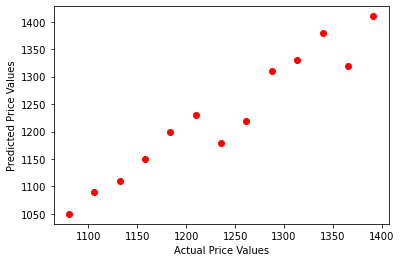

In [147]:
# Check linearity of preds to actual values
a = plt.plot(Preds,y, 'ro')
plt.xlabel("Actual Price Values")
plt.ylabel("Predicted Price Values")

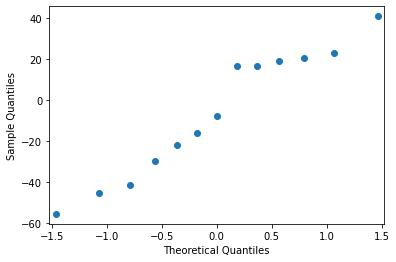

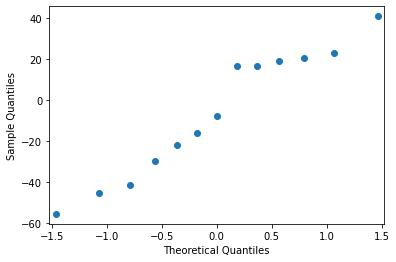

In [148]:
#Check normality of residuals
residuals = y-Preds
resids = pd.DataFrame(residuals).sort_values(by = 0).iloc[:,0]
sm.qqplot(resids)

#looks pretty normal, given there is little data